In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import torch
import torchvision
import matplotlib.pyplot as plt

import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from ipywidgets import interact, widgets

import os

try:
    from einops import rearrange
except ImportError:
    %pip install einops
    from einops import rearrange

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
# Image completion
import os
if os.path.exists('dog.jpg'):
    print('dog.jpg exists')
else:
    !wget https://segment-anything.com/assets/gallery/AdobeStock_94274587_welsh_corgi_pembroke_CD.jpg -O dog.jpg

dog.jpg exists


In [3]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")


In [4]:
# Read in a image from torchvision
import torch
import torchvision
img = torchvision.io.read_image("dog.jpg")
print(img.shape)

torch.Size([3, 1365, 2048])


In [5]:
# Make grayscale
# img = torch.tensor(img, dtype=torch.float)
# img = img.mean(dim=0, keepdim=False)


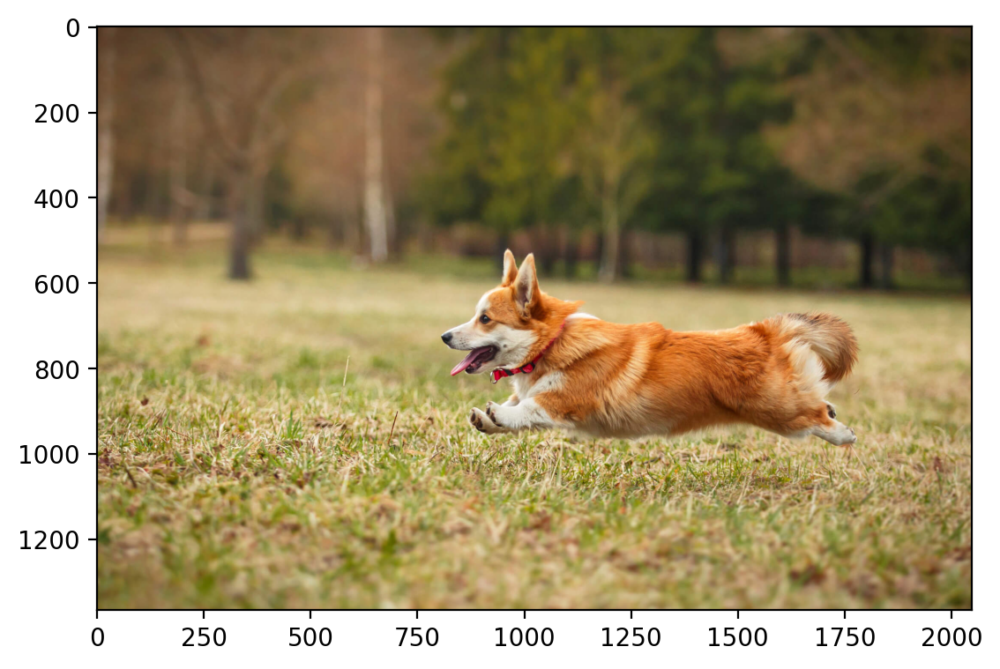

In [6]:
plt.imshow(rearrange(img, 'c h w -> h w c').numpy())


In [7]:
# Read in a image from torchvision
img = torchvision.io.read_image("dog.jpg")
from sklearn import preprocessing

scaler_img = preprocessing.MinMaxScaler().fit(img.reshape(-1, 1))
img_scaled = scaler_img.transform(img.reshape(-1, 1)).reshape(img.shape)

img_scaled = torch.tensor(img_scaled)
img_scaled = img_scaled.to(device)
img_scaled

tensor([[[0.3098, 0.3137, 0.3137,  ..., 0.2941, 0.2941, 0.2980],
         [0.3098, 0.3137, 0.3137,  ..., 0.2941, 0.2941, 0.2980],
         [0.3098, 0.3137, 0.3137,  ..., 0.2941, 0.2941, 0.2980],
         ...,
         [0.4745, 0.4745, 0.4784,  ..., 0.3804, 0.3765, 0.3765],
         [0.4745, 0.4745, 0.4784,  ..., 0.3804, 0.3804, 0.3765],
         [0.4745, 0.4745, 0.4784,  ..., 0.3843, 0.3804, 0.3804]],

        [[0.2039, 0.2078, 0.2078,  ..., 0.2157, 0.2157, 0.2118],
         [0.2039, 0.2078, 0.2078,  ..., 0.2157, 0.2157, 0.2118],
         [0.2039, 0.2078, 0.2078,  ..., 0.2157, 0.2157, 0.2118],
         ...,
         [0.4039, 0.4039, 0.4078,  ..., 0.3216, 0.3176, 0.3176],
         [0.4039, 0.4039, 0.4078,  ..., 0.3216, 0.3216, 0.3176],
         [0.4039, 0.4039, 0.4078,  ..., 0.3255, 0.3216, 0.3216]],

        [[0.1373, 0.1412, 0.1412,  ..., 0.1176, 0.1176, 0.1176],
         [0.1373, 0.1412, 0.1412,  ..., 0.1176, 0.1176, 0.1176],
         [0.1373, 0.1412, 0.1412,  ..., 0.1176, 0.1176, 0.

In [8]:
crop = torchvision.transforms.functional.crop(img_scaled, 600, 800, 300, 300)
crop.shape

torch.Size([3, 300, 300])

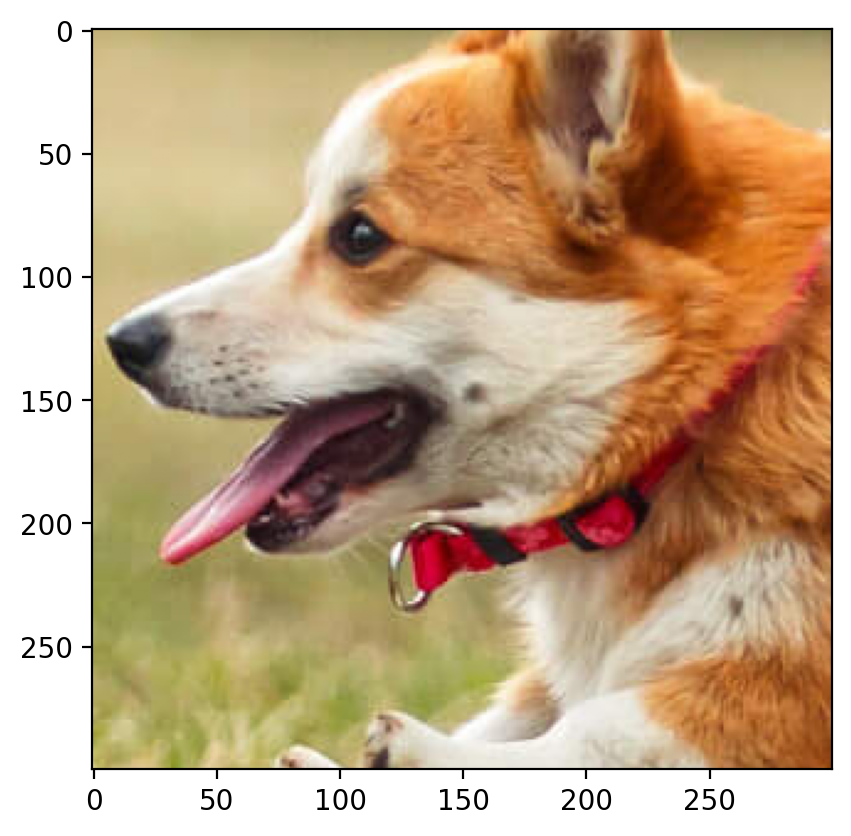

In [9]:
plt.imshow(rearrange(crop, 'c h w -> h w c').cpu().numpy())

In [10]:
cropR = crop[0].clone()
# plt.imshow(rearrange(crop, 'c h w -> h w c').cpu().numpy())
cropG = crop[1].clone()
print(cropG.shape)
cropB = crop[2].clone()

torch.Size([300, 300])


In [11]:
def mask_image_block(img, start_h, end_h, start_w, end_w):
    img_copy = img.clone().float()  # Convert to float tensor
    mask = torch.zeros_like(img, dtype=torch.bool)
    print(mask.shape)
    
    mask[start_h:end_h, start_w:end_w] = True
    img_copy[mask] = float('nan')
    
    return img_copy, mask

/home/vedantbarde/anaconda3/lib/python3.11/site-packages/matplotlib/cm.py:489: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


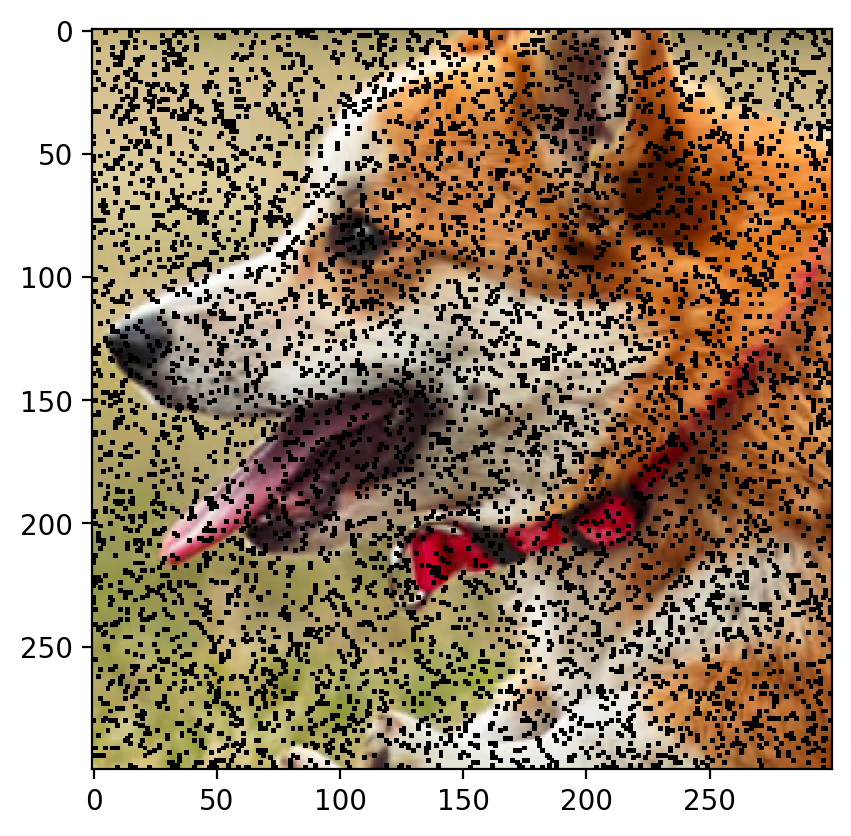

In [12]:
# Mask the image with NaN values 
proportion = [400/90000, 1600/90000, 3600/90000, 6400/90000]

def mask_image_RGB(img, prop):
       img_copy = img.clone().float()  # Convert to float tensor
       mask = torch.rand(img.shape) < prop
       img_copy[mask] = float('nan')
       return img_copy, mask
input_img = [0,0,0,0]
j = 0
for i in proportion:
    c = crop.clone().float()
    cR = cropR.clone().float()
    cG = cropG.clone().float()
    cB = cropB.clone().float()
    masked_img1 = mask_image_RGB(cR, i)
    # print(masked_img1[1].shape)
    cR = masked_img1[0]
    # plt.imshow(cropR)
    # print(masked_img[1])
    cG[masked_img1[1]] = float('nan')
    cB[masked_img1[1]] = float('nan')
    combined_tensor = torch.stack((cR, cG, cB), dim=0)
    combined_tensor = combined_tensor.detach().float()
    # print(combined_tensor)
    # plt.imshow(rearrange(combined_tensor, 'c h w -> h w c').cpu().numpy())
    input_img[j] = combined_tensor
    j = j + 1

plt.imshow(rearrange(input_img[3], 'c h w -> h w c').cpu().numpy())

In [13]:
patch_size = [20, 40, 60, 80]

def mask_block(patch_size, crop):
    x_start, y_start = 200, 100
    x_end, y_end = x_start + patch_size, y_start + patch_size
    img_missing = crop.clone()
    img_missing[:, x_start:x_end, y_start:y_end] = float('nan')
    masked_img = img_missing
    # print(masked_img)
# Convert the masked image into a numpy array to plot it with the original image
    img_missing = rearrange(img_missing.cpu(), 'c h w -> h w c').numpy()
    # original_img_numpy = rearrange(crop.cpu(), 'c h w -> h w c').numpy()
    # plt.imshow(img_missing)
    return masked_img, masked_img

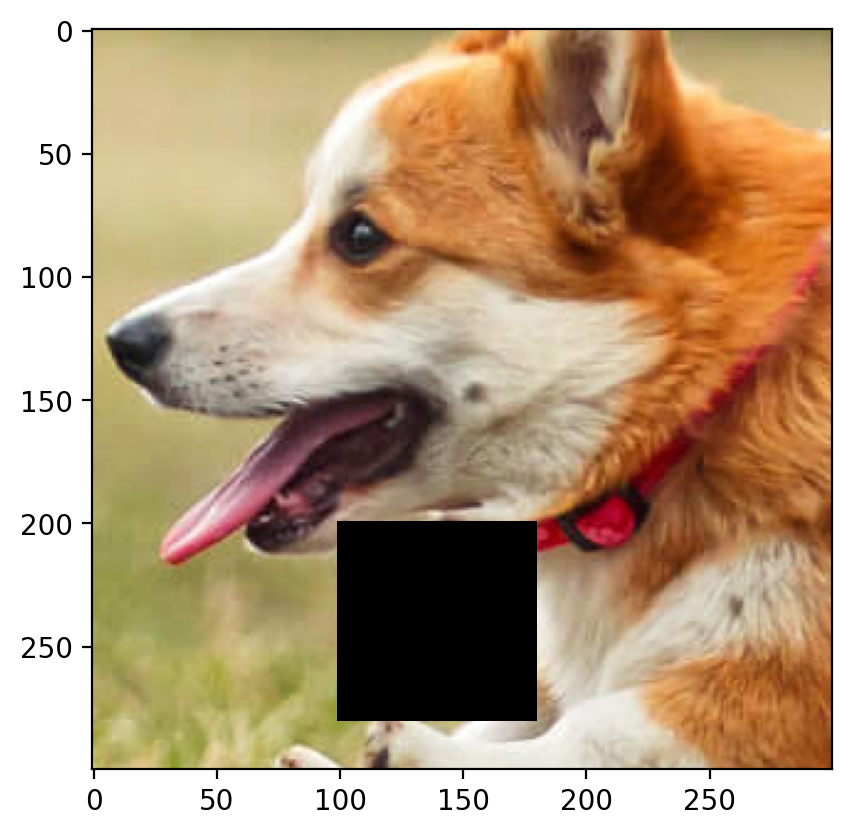

In [14]:
input_block = [0,0,0,0]
l = 0
for i in patch_size:
    x = mask_block(i, crop)
    input_block[l] = x[0]
    l = l + 1

# print(input_block)
# plt.imshow(input_block[0])
plt.imshow(rearrange(input_block[3], 'c h w -> h w c').cpu().numpy())

In [15]:
def factorize(A, k, device=torch.device("cpu"), iterations=1000):
    A = A.to(device)
    W = torch.randn(A.shape[0], k, requires_grad=True, device=device)
    H = torch.randn(k, A.shape[1], requires_grad=True, device=device)
    optimizer_W = optim.SGD([W], lr=0.01)
    optimizer_H = optim.SGD([H], lr=0.01)
    mask = ~torch.isnan(A)
    
    for j in range(iterations):
        for i in range(100):
            diff_matrix = torch.mm(W, H) - A
            diff_matrix[~mask] = 0
            loss_H = torch.norm(diff_matrix)

            optimizer_H.zero_grad()
            loss_H.backward()
            optimizer_H.step()
        
        for i in range(100):
            diff_matrix = torch.mm(W, H) - A
            diff_matrix[~mask] = 0
            loss_W = torch.norm(diff_matrix)

            optimizer_W.zero_grad()
            loss_W.backward()
            optimizer_W.step()
    
    return W, H, loss_W + loss_H

img_output = [0,0,0,0]
block_output = [0,0,0,0]

for b in range(4):
    c = input_img[b]
    cR = c[0].clone()
    cG = c[1].clone()
    cB = c[2].clone()
    
    c1 = input_block[b]
    cR1 = c1[0].clone()
    cG1 = c1[1].clone()
    cB1 = c1[2].clone()
    

    WR, HR, loss_R = factorize(cR, k=100, device=device, iterations=100)
    WG, HG, loss_G = factorize(cG, k=100, device=device, iterations=100)
    WB, HB, loss_B = factorize(cB, k=100, device=device, iterations=100)
    RR = torch.mm(WR,HR)
    GG = torch.mm(WG,HG)
    BB = torch.mm(WB,HB)
    combined_tensor = torch.stack((RR, GG, BB), dim=0).detach().float()
    img_output[b] = combined_tensor    


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


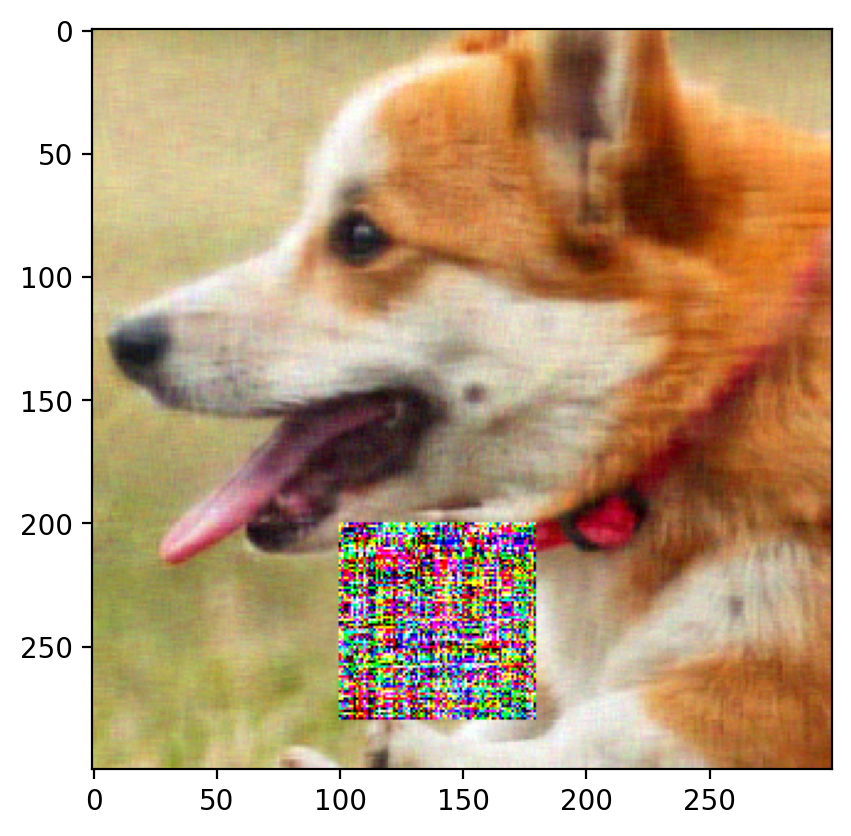

In [16]:
for b in range(4):
    c1 = input_block[b]
    cR1 = c1[0].clone()
    cG1 = c1[1].clone()
    cB1 = c1[2].clone()
    WR1, HR1, loss_R1 = factorize(cR1, k=100, device=device, iterations=100)
    WG1, HG1, loss_G1 = factorize(cG1, k=100, device=device, iterations=100)
    WB1, HB1, loss_B1 = factorize(cB1, k=100, device=device, iterations=100)
    RR1 = torch.mm(WR1,HR1)
    GG1 = torch.mm(WG1,HG1)
    BB1 = torch.mm(WB1,HB1)
    combined_tensor1 = torch.stack((RR1, GG1, BB1), dim=0).detach().float()
    block_output[b] = combined_tensor1    
    plt.imshow(rearrange(combined_tensor1, 'c h w -> h w c').cpu().numpy())


In [17]:
def plot_output(input, output):
    for i in range(4):
        fig, ax = plt.subplots(1, 2, figsize=(10, 5))
        ax[0].set_title("Masked image")
        ax[0].imshow(rearrange(input[i], 'c h w -> h w c').cpu().numpy())
        ax[1].set_title("Reconstructed image")
        ax[1].imshow(rearrange(output[i], 'c h w -> h w c').cpu().numpy())

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


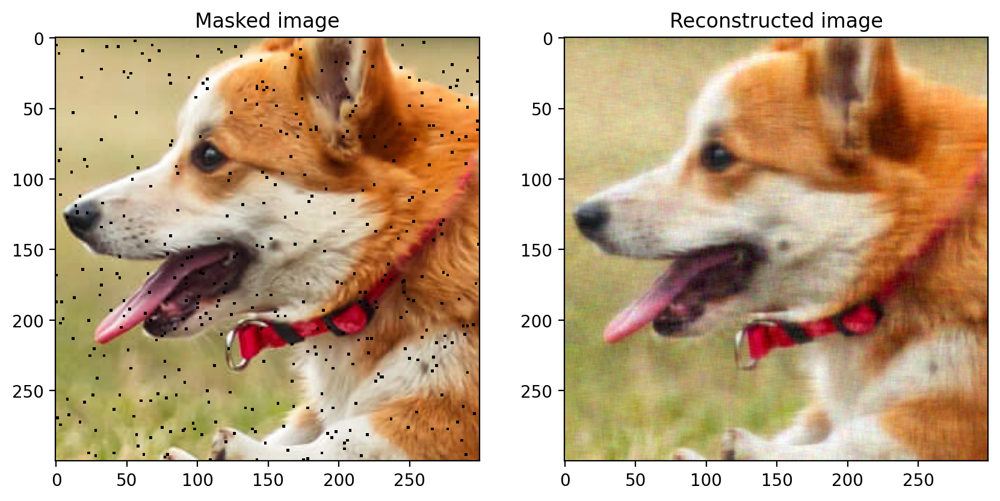

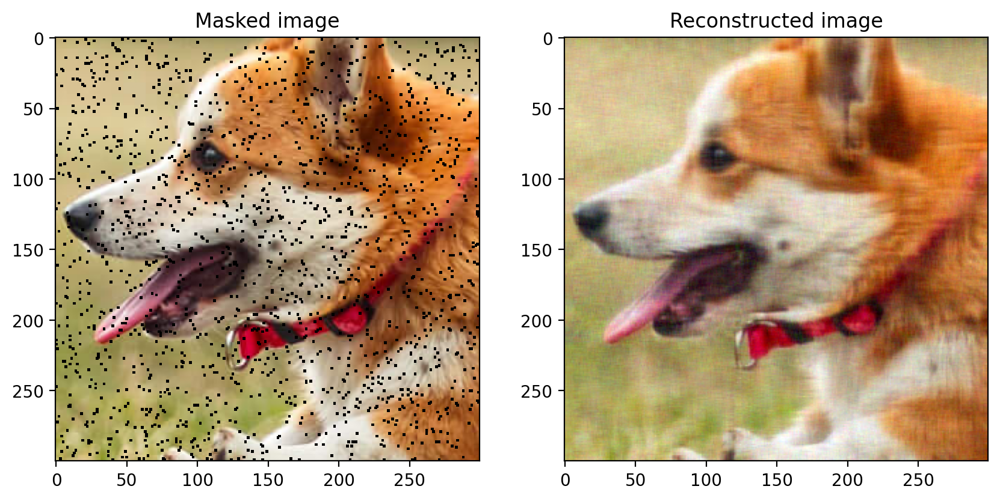

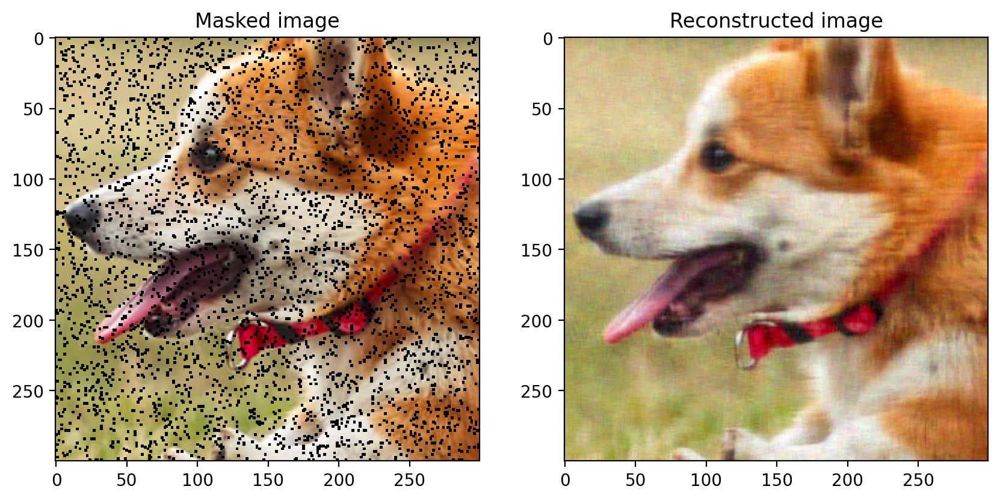

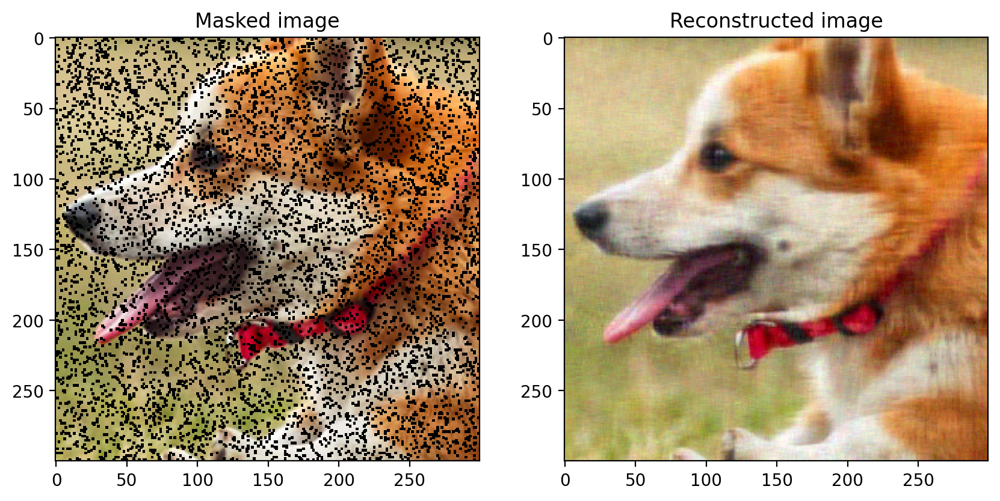

In [18]:
plot_output(input_img, img_output)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


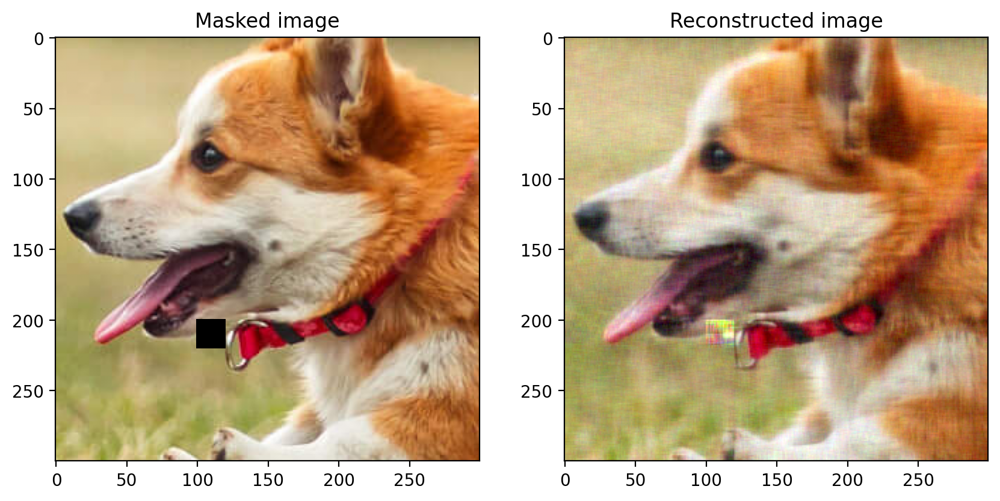

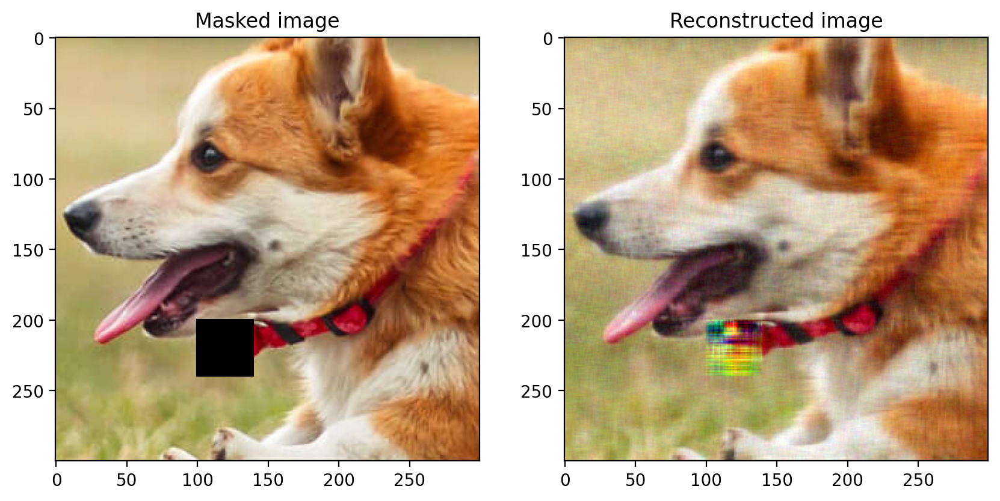

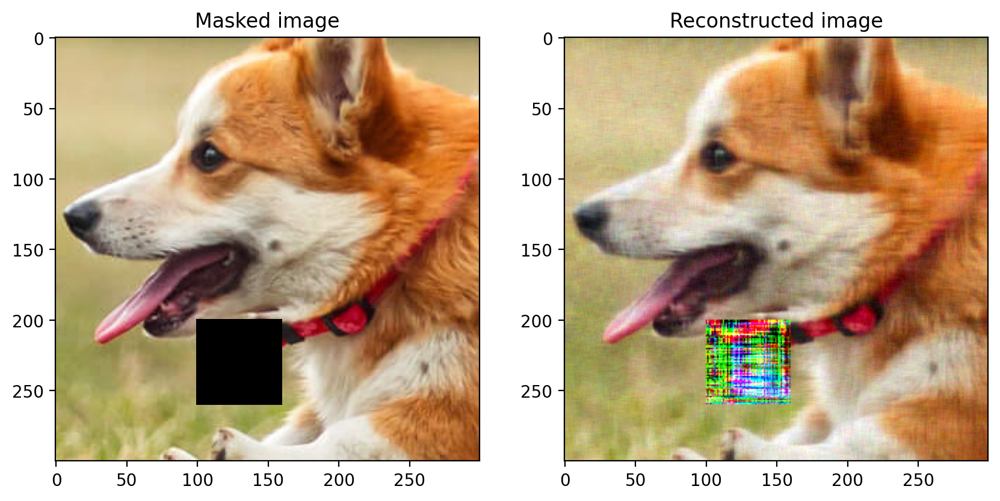

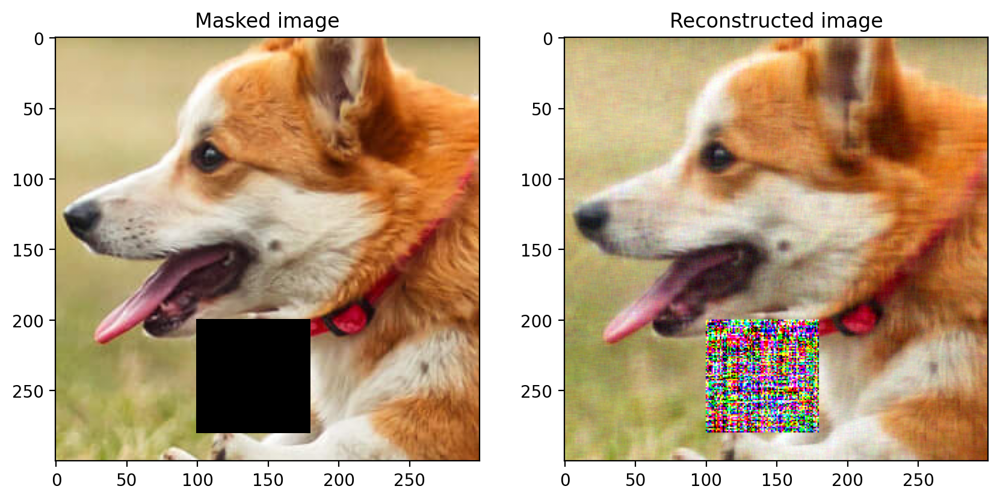

In [19]:
plot_output(input_block, block_output)

In [20]:
import torch
import torch.nn.functional as F
from torchvision import transforms
from PIL import Image

def calculate_rmse(predicted_image, target_image):
    # Calculate squared differences
    squared_diff = (predicted_image - target_image) ** 2

    # Calculate mean squared error
    mean_squared_error = torch.mean(squared_diff)

    # Calculate RMSE
    rmse = torch.sqrt(mean_squared_error)

    return rmse.item()  # Convert to Python float

rmse_img = [0, 0, 0, 0]
rmse_block = [0, 0, 0, 0]
for i in range(4):
    rmse1 = calculate_rmse(img_output[i], crop)
    rmse_img[i] = rmse1

for i in range(4):
    rmse1 = calculate_rmse(block_output[i], crop)
    rmse_block[i] = rmse1


# Example usage:
# Load example RGB images using Pillow (PIL)
# predicted_image_path = "path/to/predicted_image.jpg"
# target_image_path = "path/to/target_image.jpg"

# Transform PIL images to PyTorch tensors
# transform = transforms.ToTensor()
# predicted_image = transform(Image.open(predicted_image_path)).unsqueeze(0)
# target_image = transform(Image.open(target_image_path)).unsqueeze(0)

# Calculate RMSE
# rmse_result = calculate_rmse(predicted_image, target_image)
# print("Root Mean Squared Error (RMSE):", rmse_result)


[0.0379861677322229, 0.038081854118729476, 0.03934279063104104, 0.039290821343333844]
[0.040696453162986895, 0.05041815981046172, 0.12260094721734385, 0.3847752777363698]


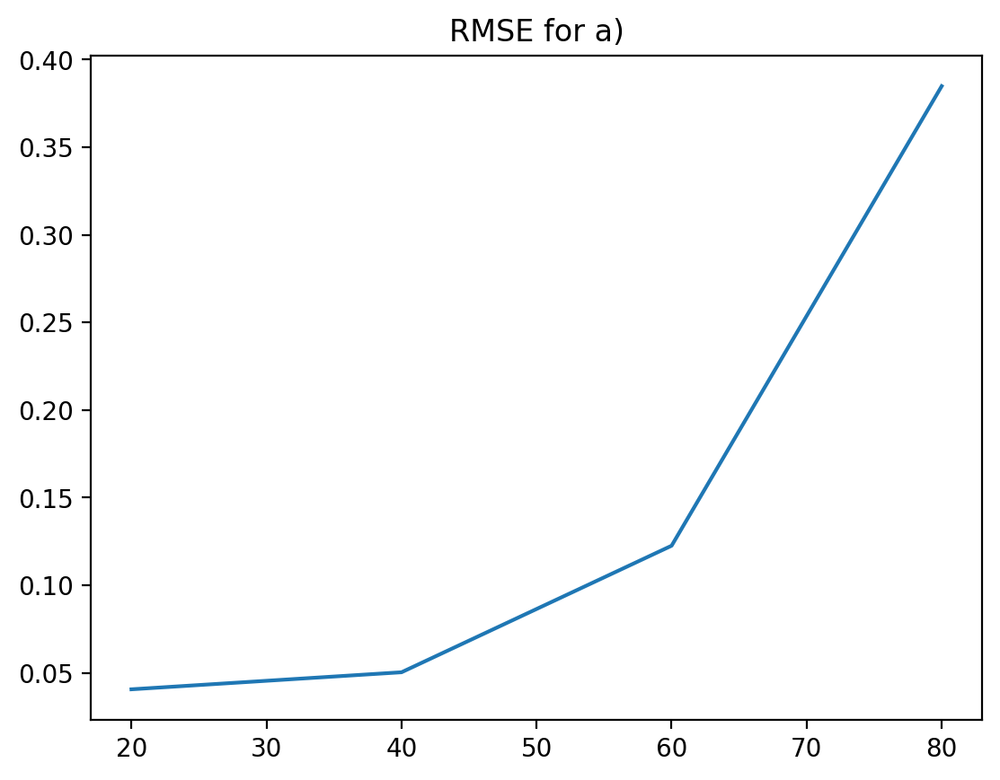

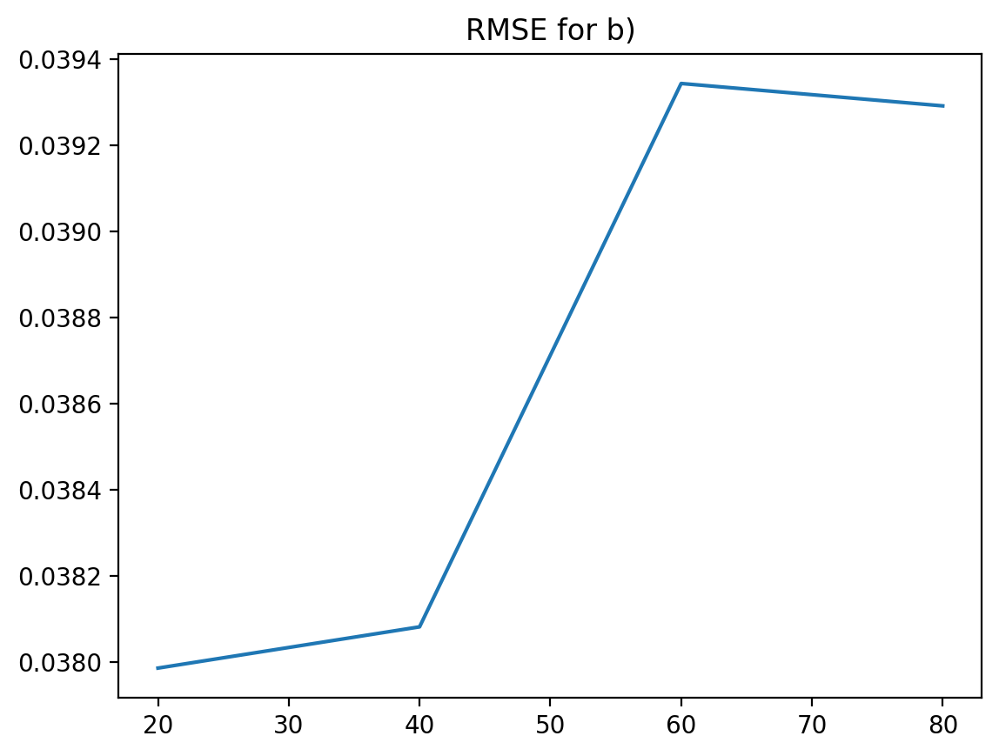

In [36]:
import matplotlib.pyplot as plt
plt.plot(patch_size, rmse_block)
plt.title("RMSE for a)")
plt.show()

import matplotlib.pyplot as plt
plt.plot(patch_size, rmse_img)
plt.title("RMSE for b)")
plt.show()



# plt.rcParams["figure.figsize"] = [7.50, 3.50]
# plt.rcParams["figure.autolayout"] = True

# x = np.array([5, 4, 1, 4, 5])
# y = np.sort(x)

# plt.plot(x, y, color="red")

# plt.show()

In [41]:
import torch
import torch.nn.functional as F

def calculate_psnr(predicted, target, max_value=255.0):
    if predicted.shape != target.shape:
       raise ValueError("Shape of predicted and target images must be the same.")

    # Calculate squared differences
    squared_diff = (predicted - target).pow(2).sum()

    # Calculate mean squared error
    mse = squared_diff.mean()

    # Calculate PSNR
    psnr = 10 * torch.log10((max_value ** 2) / mse)

    return psnr.item()
psnr_img = [0, 0, 0, 0]
psnr_block = [0, 0, 0, 0]

for i in range(4):
    psnr1 = calculate_psnr(img_output[i], crop)
    psnr_img[i] = psnr1

for i in range(4):
    psnr1 = calculate_psnr(block_output[i], crop)
    psnr_block[i] = psnr1


In [39]:
psnr_img

[22.224656335373496, 22.202804266364552, 21.91986273306476, 21.931343817348758]

In [42]:
psnr_block

[21.62603475500027, 19.76542615684018, 12.047289455826872, 2.1130227604593537]

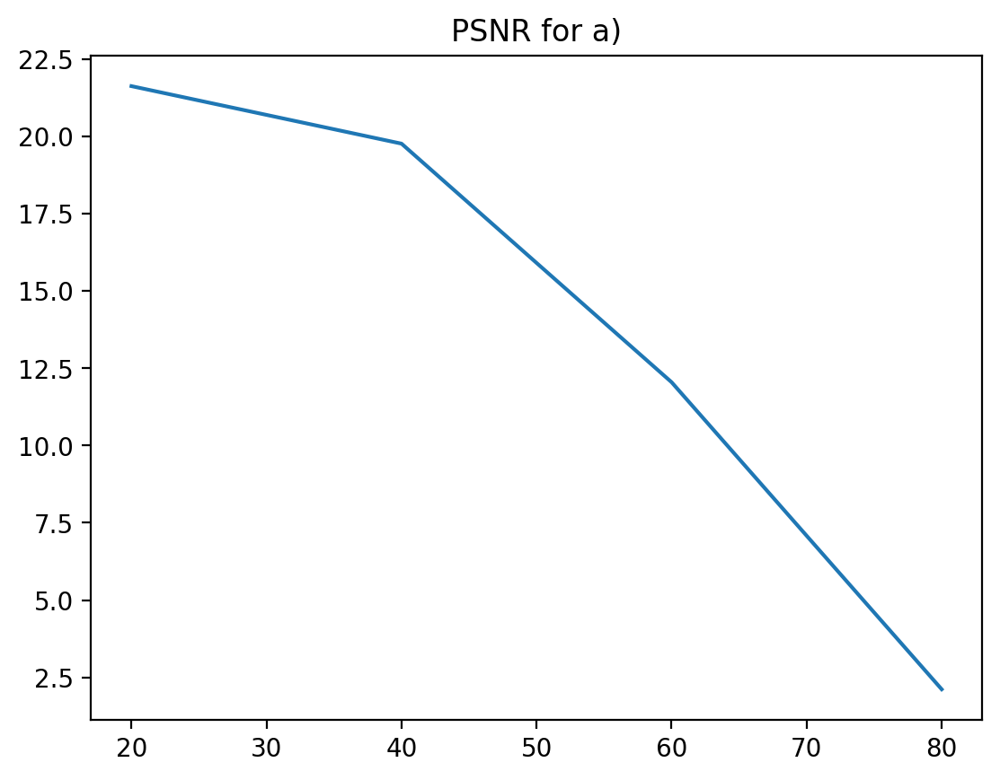

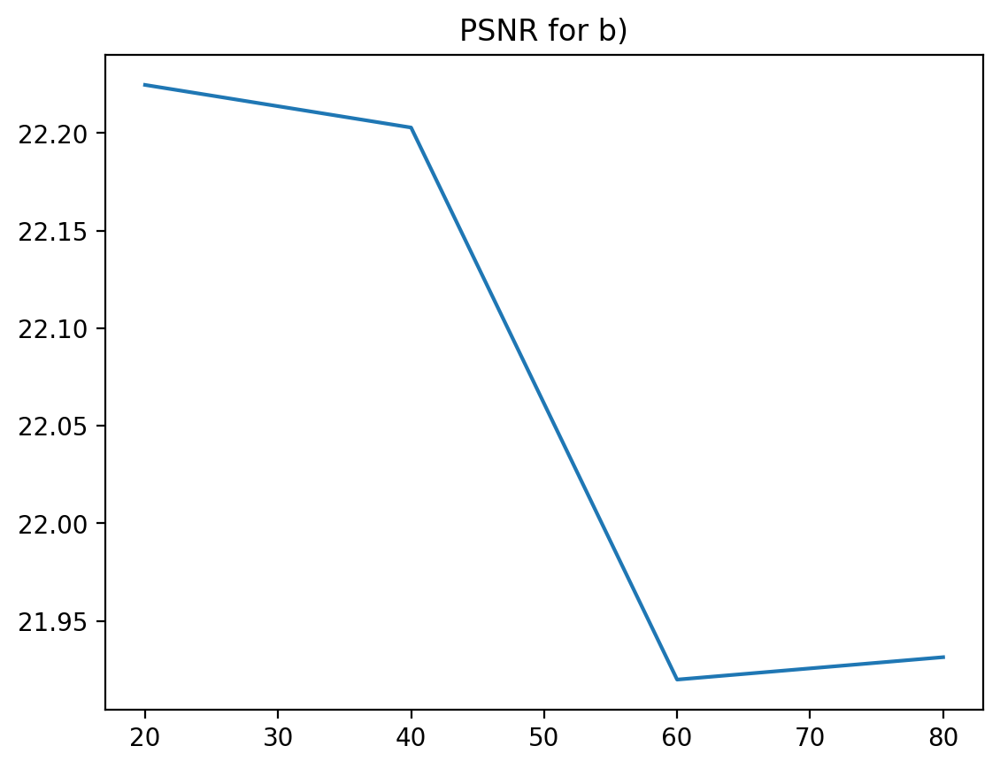

In [43]:
import matplotlib.pyplot as plt
plt.plot(patch_size, psnr_block)
plt.title("PSNR for a)")
plt.show()
import matplotlib.pyplot as plt
plt.plot(patch_size, psnr_img)
plt.title("PSNR for b)")
plt.show()